## Viewing Schema

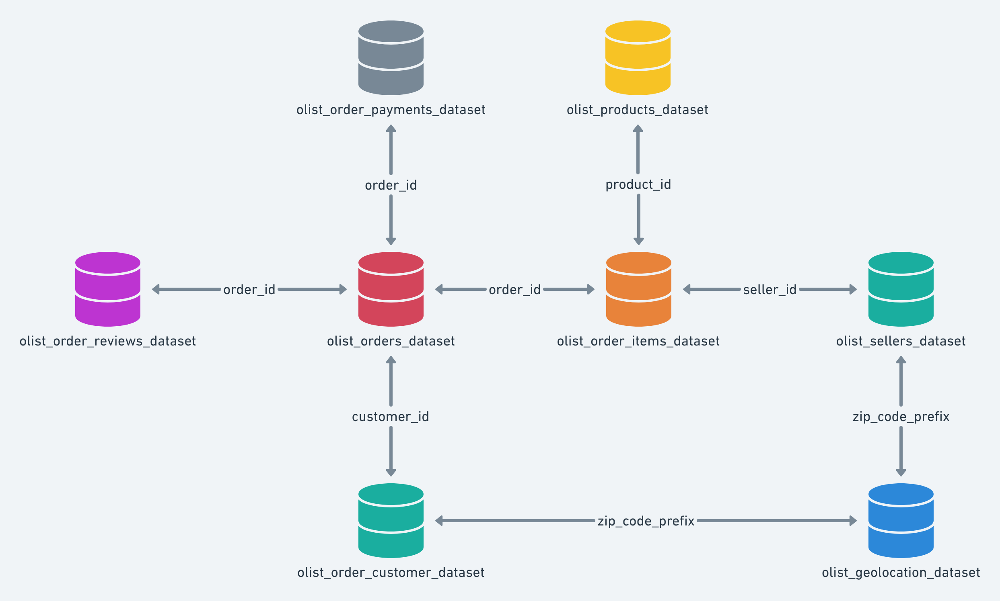

In [1]:
from IPython.display import Image

Image('schema.png')

## Listing CSVs in the directory

In [2]:
!ls data/*.csv

data/olist_customers_dataset.csv
data/olist_geolocation_dataset.csv
data/olist_order_items_dataset.csv
data/olist_order_payments_dataset.csv
data/olist_order_reviews_dataset.csv
data/olist_orders_dataset.csv
data/olist_products_dataset.csv
data/olist_sellers_dataset.csv
data/product_category_name_translation.csv


## Reading dataset

In [3]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px

pd.set_option('display.max_rows', 100, 'display.max_columns', 50)

In [4]:
order_customer_df = pd.read_csv('data/olist_customers_dataset.csv')

orders_df = pd.read_csv('data/olist_orders_dataset.csv',
                        parse_dates=[
                            'order_purchase_timestamp', 'order_approved_at', 
                            'order_delivered_carrier_date', 'order_delivered_customer_date',
                            'order_estimated_delivery_date'
                        ]
                       )

### Inspecting dataset

#### Order Customer data

In [5]:
display(order_customer_df.head())

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


#### Orders data

In [6]:
display(orders_df.head())

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


### Shape of dataset

#### Order Customer data

In [7]:
order_customer_df.shape

(99441, 5)

#### Orders data

In [8]:
orders_df.shape

(99441, 8)

### Unique value stats

In [9]:
def unique_value_count(df):
    for col in df.columns:
        if df[col].dtype == 'object':
            print(f"{col}: {df[col].nunique()}")
            print('-'*40)

#### Order Customer data

In [10]:
unique_value_count(df=order_customer_df)

customer_id: 99441
----------------------------------------
customer_unique_id: 96096
----------------------------------------
customer_city: 4119
----------------------------------------
customer_state: 27
----------------------------------------


#### Orders data

In [11]:
unique_value_count(df=orders_df)

order_id: 99441
----------------------------------------
customer_id: 99441
----------------------------------------
order_status: 8
----------------------------------------


### Null value counts

In [12]:
def missing_value_stats(df):
    num_rows = df.shape[0]
    # Missing value count by columns
    df_missing = df.isna().sum().reset_index()
    # Renaming columns
    df_missing.columns = ['column', 'missing_values']
    # Getting only those columns having missing values > 0
    df_missing = df_missing[df_missing['missing_values'] > 0]
    df_missing.reset_index(drop=True, inplace=True)
    # Calculating percentage of missing
    df_missing['missing_percentage'] = df_missing['missing_values'].apply(
        lambda missing_value: round((missing_value / num_rows) * 100, 2)
    )
    
    if df_missing.shape[0] > 0:
        return df_missing
    else:
        return "No nulls in the data"

In [13]:
missing_value_stats(order_customer_df)

'No nulls in the data'

In [14]:
display(missing_value_stats(orders_df))

,column,missing_values,missing_percentage
0,order_approved_at,160,0.16
1,order_delivered_carrier_date,1783,1.79
2,order_delivered_customer_date,2965,2.98


# Missing value analysis

In [15]:
null_orders_approved = orders_df[orders_df['order_approved_at'].isna()]
 
display(null_orders_approved.head())

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaT,NaT,NaT,2018-09-12
1801,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:16,NaT,NaT,NaT,2018-10-17
1868,df8282afe61008dc26c6c31011474d02,aa797b187b5466bc6925aaaa4bb3bed1,canceled,2017-03-04 12:14:30,NaT,NaT,NaT,2017-04-10
2029,8d4c637f1accf7a88a4555f02741e606,b1dd715db389a2077f43174e7a675d07,canceled,2018-08-29 16:27:49,NaT,NaT,NaT,2018-09-13
2161,7a9d4c7f9b068337875b95465330f2fc,7f71ae48074c0cfec9195f88fcbfac55,canceled,2017-05-01 16:12:39,NaT,NaT,NaT,2017-05-30


**Conclusion:** If the `order_status` is **_canceled_** then the nulls in `order_approved_at`, `order_delivered_carrier_date`, and `order_delivered_customer_date` are really making sense.

#### Now the above conclusion gave rise to the following questions:

* Is it really for the `order_status` _canceled_ or the `order_status` can have different values?


* The columns `order_delivered_carrier_date` and `order_delivered_customer_date` have more nulls then the `order_status`, will inspect it later.

### Is it really when the `order_status == 'canceled'` or the `order_status` can have different values?

In [16]:
null_orders_approved['order_status'].value_counts()

canceled     141
delivered     14
created        5
Name: order_status, dtype: int64

**Observation:** Not just for canceled, but when **order_status** is "delivered" or "created" there are null values too in `order_approved_at`.

#### order_status == 'delivered'

In [17]:
null_orders_approved.query("order_status == 'delivered'")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
5323,e04abd8149ef81b95221e88f6ed9ab6a,2127dc6603ac33544953ef05ec155771,delivered,2017-02-18 14:40:00,NaT,2017-02-23 12:04:47,2017-03-01 13:25:33,2017-03-17
16567,8a9adc69528e1001fc68dd0aaebbb54a,4c1ccc74e00993733742a3c786dc3c1f,delivered,2017-02-18 12:45:31,NaT,2017-02-23 09:01:52,2017-03-02 10:05:06,2017-03-21
19031,7013bcfc1c97fe719a7b5e05e61c12db,2941af76d38100e0f8740a374f1a5dc3,delivered,2017-02-18 13:29:47,NaT,2017-02-22 16:25:25,2017-03-01 08:07:38,2017-03-17
22663,5cf925b116421afa85ee25e99b4c34fb,29c35fc91fc13fb5073c8f30505d860d,delivered,2017-02-18 16:48:35,NaT,2017-02-22 11:23:10,2017-03-09 07:28:47,2017-03-31
23156,12a95a3c06dbaec84bcfb0e2da5d228a,1e101e0daffaddce8159d25a8e53f2b2,delivered,2017-02-17 13:05:55,NaT,2017-02-22 11:23:11,2017-03-02 11:09:19,2017-03-20
26800,c1d4211b3dae76144deccd6c74144a88,684cb238dc5b5d6366244e0e0776b450,delivered,2017-01-19 12:48:08,NaT,2017-01-25 14:56:50,2017-01-30 18:16:01,2017-03-01
38290,d69e5d356402adc8cf17e08b5033acfb,68d081753ad4fe22fc4d410a9eb1ca01,delivered,2017-02-19 01:28:47,NaT,2017-02-23 03:11:48,2017-03-02 03:41:58,2017-03-27
39334,d77031d6a3c8a52f019764e68f211c69,0bf35cac6cc7327065da879e2d90fae8,delivered,2017-02-18 11:04:19,NaT,2017-02-23 07:23:36,2017-03-02 16:15:23,2017-03-22
48401,7002a78c79c519ac54022d4f8a65e6e8,d5de688c321096d15508faae67a27051,delivered,2017-01-19 22:26:59,NaT,2017-01-27 11:08:05,2017-02-06 14:22:19,2017-03-16
61743,2eecb0d85f281280f79fa00f9cec1a95,a3d3c38e58b9d2dfb9207cab690b6310,delivered,2017-02-17 17:21:55,NaT,2017-02-22 11:42:51,2017-03-03 12:16:03,2017-03-20


**Conclusion:** The nulls in `order_approved_at` when `order_status` is **delivered** can be filled by the following algorithm:

* Calculating delay between `order_purchase_timestamp` and `order_approved_at`


* Observing the distribution by year and in general for imputing the missing values as follows:
    
    * Using mean, median or mode
    
    * By extrapolating

#### order_status == 'created'

In [18]:
null_orders_approved.query("order_status == 'created'")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
7434,b5359909123fa03c50bdb0cfed07f098,438449d4af8980d107bf04571413a8e7,created,2017-12-05 01:07:52,NaT,NaT,NaT,2018-01-11
9238,dba5062fbda3af4fb6c33b1e040ca38f,964a6df3d9bdf60fe3e7b8bb69ed893a,created,2018-02-09 17:21:04,NaT,NaT,NaT,2018-03-07
21441,7a4df5d8cff4090e541401a20a22bb80,725e9c75605414b21fd8c8d5a1c2f1d6,created,2017-11-25 11:10:33,NaT,NaT,NaT,2017-12-12
55086,35de4050331c6c644cddc86f4f2d0d64,4ee64f4bfc542546f422da0aeb462853,created,2017-12-05 01:07:58,NaT,NaT,NaT,2018-01-08
58958,90ab3e7d52544ec7bc3363c82689965f,7d61b9f4f216052ba664f22e9c504ef1,created,2017-11-06 13:12:34,NaT,NaT,NaT,2017-12-01


### Creating `order_accept_delay` column

In [19]:
# Firstly sorting the dataframe
orders_df = orders_df.sort_values(by=['order_purchase_timestamp']).reset_index(drop=True)


# Calculating delay in hours
orders_df['order_accept_delay_hours'] = np.subtract(orders_df['order_approved_at'],
                                                    orders_df['order_purchase_timestamp']
                                                   ) / pd.Timedelta('1 hour')

display(orders_df.head())

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_accept_delay_hours
0,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaT,2016-10-20,784.045556
1,e5fa5a7210941f7d56d0208e4e071d35,683c54fc24d40ee9f8a6fc179fd9856c,canceled,2016-09-05 00:15:34,2016-10-07 13:17:15,NaT,NaT,2016-10-28,781.028056
2,809a282bbd5dbcabb6f2f724fca862ec,622e13439d6b5a0b486c435618b2679e,canceled,2016-09-13 15:24:19,2016-10-07 13:16:46,NaT,NaT,2016-09-30,573.874167
3,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04,0.000000
4,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02 22:07:52,2016-10-06 15:50:56,NaT,NaT,2016-10-25,89.717778


### Visualizing delay in accepting the order

In [20]:
fig = px.line(orders_df, x='order_purchase_timestamp', y='order_accept_delay_hours')

fig.update_layout(xaxis_range=['2016-09-01','2018-09-30'],
                  title_text="Delay in accepting the order")
fig.show()

**Observation:**

* Looks like the order acceptance takes more time in 2016 as compared to the other years.


* By time the delay in accepting the order is decreased

In [21]:
order_2017 = orders_df.query("2017 <= order_purchase_timestamp < 2018")

order_2017['order_purchase_date'] = order_2017['order_purchase_timestamp'].dt.date
order_2017['order_purchase_month'] = order_2017['order_purchase_timestamp'].apply(
    lambda timestamp: str(timestamp)[:7])

order_2017.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_accept_delay_hours,order_purchase_date,order_purchase_month
329,ec7a019261fce44180373d45b442d78f,c24fc5f9a446b4d8262041b9c64de772,delivered,2017-01-05 11:56:06,2017-01-05 12:10:17,2017-01-06 12:43:41,2017-01-11 13:14:05,2017-02-01,0.236389,2017-01-05,2017-01
330,b95a0a8bd30aece4e94e81f0591249d8,ff3c6d35b4927c9b965aa6a68dcf56e4,delivered,2017-01-05 12:01:20,2017-01-07 03:35:37,2017-01-11 16:22:53,2017-01-17 15:38:58,2017-02-13,39.571389,2017-01-05,2017-01
331,38bcb524e1c38c2c1b60600a80fc8999,d2c63ad286e3ca9dd69218008d61ff81,delivered,2017-01-05 12:06:36,2017-01-07 03:45:22,2017-01-11 15:35:54,2017-01-16 16:05:22,2017-02-13,39.646111,2017-01-05,2017-01
332,7a18a504c1a4b32d883e68de2e1a7db0,e6bee29442c761ff0dfb9a4414922a5c,delivered,2017-01-05 12:09:08,2017-01-07 03:44:08,2017-01-11 15:35:53,2017-01-16 15:43:29,2017-02-13,39.583333,2017-01-05,2017-01
333,6acecf438369055d9243e121045cca74,42d857e22f61f10476f0cda1aacc018a,delivered,2017-01-05 12:11:23,2017-01-07 03:44:07,2017-01-11 16:22:53,2017-01-17 16:06:30,2017-02-13,39.545556,2017-01-05,2017-01


**To-do:**

* Filling the missing values by mean (after removing the extreme values) and extrapolation